In [1]:
#pip install https://github.com/simnibs/simnibs/releases/download/v4.0.1/simnibs-4.0.1-cp39-cp39-macosx_10_11_x86_64.whl
import seaborn as sns
import numpy as np
import pandas as pd
import xarray as xr
from tqdm.notebook import tqdm
from itertools import product
import mne

from simnibs import read_msh
from simnibs.simulation import electric_dipole
from simnibs import read_msh, sim_struct

#### Tissue segmentations was performed with the CHARM pipeline installed with SimNIMS

```bash
$> cd /Users/christian/Applications/SimNIBS-4.0/bin
$> ERNIE=/Users/christian/Library/CloudStorage/OneDrive-UniversityofSouthCarolina/simnibs4_examples
$> ./charm ernie $ERNIE/org/ernie_T1.nii.gz $ERNIE/org/ernie_T2.nii.gz
```

#### Surface extraction with FreeSurfer

```bash
$> recon-all -subjid ernie -i /Users/christian/Applications/SimNIBS-4.0/bin/m2m_ernie/T1.nii.gz -T2 /Users/christian/Applications/SimNIBS-4.0/bin/m2m_ernie/T2_reg.nii.gz -all
```

In [2]:
#subject="ernie"
#mne.bem.make_watershed_bem(subject=subject)

In [3]:
subpath = 'm2m_ernie'
pathfem = '/Users/christian/Applications/SimNIBS-4.0/bin/'

mesh = read_msh(pathfem + subpath + "/ernie.msh")

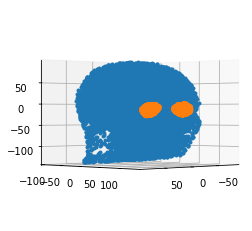

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt

ax = plt.figure().add_subplot(projection='3d')
ax.plot(*mesh.elements_baricenters().value[mesh.elm.tag1 != 6][::100].T, ".")
ax.plot(*mesh.elements_baricenters().value[mesh.elm.tag1 == 6].T, ".")
# The value 6 of take from final_tissue_LUT.txt and correspond to eye elements

ax.view_init(0, 45)

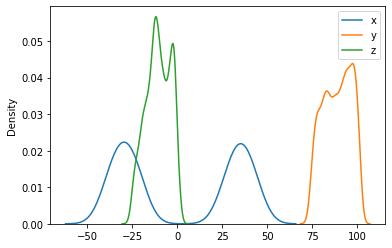

In [5]:
eye_ctr = mesh.elements_baricenters().value[mesh.elm.tag1 == 6]
x, y, z = eye_ctr.T

sns.kdeplot(x, label="x")
sns.kdeplot(y, label="y")
sns.kdeplot(z, label="z")
plt.legend()

#The eyes are separated along the x-axis and can be separated using a threshold at x=0

# y: posterior-anterior
# x: medio-lateral
# z: dorso-ventral

In [6]:
print(np.unique(mesh.elm.tag1))
"""
1 White Matter 0.126
2 Gray Matter 0.275
3 CSF 1.654
4 Bone 0.01
5 Scalp 0.465
6 Eye balls 0.5
7 Compact Bone 0.008
8 Spongy Bone 0.025
9 Blood 0.6
10 Muscle 0.16
"""
S = sim_struct.SESSION()
tdcs = S.add_tdcslist()

# 1 to 10 are volume elements; 1001 to 1010 are corresponding surface elements;
# These numbers and their correspondance can be seen in ernie.mesh.opt
ids = (mesh.elm.tag1 % 1000) - 1   # -1 for zero indexing

[   1    2    3    5    6    7    8    9   10 1001 1002 1003 1005 1006
 1007 1008 1009 1010]


In [7]:
"""
cond = np.zeros_like(ids).astype(float)
for i in range(10): # Looping through the tissue types and setting their conductivities
    cond[ids == i] = tdcs.cond[i].value

eye_ctr = mesh.elements_baricenters().value[mesh.elm.tag1 == 6]
# One dipole at the center of each eye
dipole_positions = np.array([eye_ctr[x<0].mean(0),
                             eye_ctr[x>0].mean(0)])
 
# Dipole moment pointing directly in front of the eye. Ampere-meter
dipole_moments = np.array([[0, 1, 0],
                           [0, 1, 0]])

source_model = 'partial integration' #or `st. venant`

sim = electric_dipole(mesh, 
                        cond, 
                        dipole_positions, 
                        dipole_moments, 
                        source_model, 
                        solver_options=None, units='mm')""";

In [9]:
"""import matplotlib.pyplot as plt
import matplotlib

def plot_field(values, mesh, view=(0, 45)):
    cmap = plt.cm.rainbow
    norm = matplotlib.colors.Normalize(vmin=np.percentile(values.sum(0), 1), 
                                    vmax=np.percentile(values.sum(0), 99))
    colors = cmap(norm(values.sum(0)))

    ax = plt.figure().add_subplot(projection='3d')
    ax.scatter(*mesh.nodes.node_coord[::10].T, c=colors[::10])

    ax.view_init(*view)

plot_field(sim, mesh, (15, 60))""";

In [10]:
# Each individual eye has a horizontal FOV of about 135 degrees and a vertical FOV of just over 180 degrees
# x: medio-lateral
# y: posterior-anterior
# z: dorso-ventral
# theta: elevation

"""
n = 11
thetas = np.linspace(-np.pi/2, np.pi/2, n)
phis = np.linspace(-135/2/180*np.pi, 135/2/180*np.pi, n)

sims = xr.DataArray(np.zeros((2, sim.shape[1], n, n)),
                    coords={"dipole" : ["eye_left", "eye_right"],
                            "node": np.arange(sim.shape[1]),
                            "theta": thetas,
                            "phi": phis
                            })

for theta, phi in tqdm(list(product(thetas, phis))):
    x = np.sin(phi)*np.cos(theta) 
    z = np.sin(phi)*np.sin(theta) 
    y = np.cos(phi)

    # Dipole moment pointing directly in front of the eye. Ampere-meter
    dipole_moments = np.array([[x, y, z]]*2)

    source_model = 'partial integration' #or `st. venant`

    sim = electric_dipole(mesh, 
                            cond, 
                            dipole_positions, 
                            dipole_moments, 
                            source_model, 
                            solver_options=None, units='mm')
    
    sims.loc[dict(theta=theta, phi=phi)] = sim

sims.to_netcdf("sims.netcdf")""";

#### Using superposition, we can compute dipoles at the eyes in three ortogonale directions and then use these to compute the results from any dipole orientation

In [11]:
cond = np.zeros_like(ids).astype(float)
for i in range(10): # Looping through the tissue types and setting their conductivities
    cond[ids == i] = tdcs.cond[i].value

eye_ctr = mesh.elements_baricenters().value[mesh.elm.tag1 == 6]
# Tree dipoles at the center of each eye, one for each ortogonal directions
x = eye_ctr.T[0]
dipole_positions = np.array([eye_ctr[x<0].mean(0),
                             eye_ctr[x<0].mean(0),
                             eye_ctr[x<0].mean(0),
                             eye_ctr[x>0].mean(0),
                             eye_ctr[x>0].mean(0),
                             eye_ctr[x>0].mean(0)])
 
# Dipole moment pointing directly in front of the eye and in the 
# two other ortogonal directions. Ampere-meter
dipole_moments = np.array([[1, 0, 0],
                           [0, 1, 0],
                           [0, 0, 1],
                           [1, 0, 0],
                           [0, 1, 0],
                           [0, 0, 1]])

source_model = 'partial integration' #or `st. venant`

sim = electric_dipole(mesh, 
                        cond, 
                        dipole_positions, 
                        dipole_moments, 
                        source_model, 
                        solver_options=None, units='mm')


[ simnibs ]INFO: Assembling FEM Matrix
[ simnibs ]INFO: 21.75s to assemble FEM matrix
[ simnibs ]INFO: Using solver options: -ksp_type cg -ksp_rtol 1e-10 -pc_type hypre -pc_hypre_type boomeramg -pc_hypre_boomeramg_coarsen_type HMIS
[ simnibs ]INFO: Preparing the KSP
[ simnibs ]INFO: Time to prepare the KSP: 3.60s
[ simnibs ]INFO: Solving system 1 of 6
[ simnibs ]INFO: Running PETSc with KSP: cg PC: hypre
[ simnibs ]INFO: Number of iterations: 33 Residual Norm: 1.52e-06
[ simnibs ]INFO: KSP Converged with reason: 2
[ simnibs ]INFO: Time to solve system: 12.21s
[ simnibs ]INFO: Solving system 2 of 6
[ simnibs ]INFO: Running PETSc with KSP: cg PC: hypre
[ simnibs ]INFO: Number of iterations: 33 Residual Norm: 2.32e-06
[ simnibs ]INFO: KSP Converged with reason: 2
[ simnibs ]INFO: Time to solve system: 12.17s
[ simnibs ]INFO: Solving system 3 of 6
[ simnibs ]INFO: Running PETSc with KSP: cg PC: hypre
[ simnibs ]INFO: Number of iterations: 33 Residual Norm: 1.76e-06
[ simnibs ]INFO: KSP Con

In [12]:
"""n = 61
phis = np.linspace(-135/2/180*np.pi, 135/2/180*np.pi, n)

for no, phi in tqdm(list(enumerate(list(phis) + list(phis[-2::-1])))):
    theta = 0
    x = np.sin(phi)*np.cos(theta) 
    z = np.sin(phi)*np.sin(theta) 
    y = np.cos(phi)

    values = np.array([sim[0, :]*x + sim[1, :]*y + sim[2, :]*z, 
                    sim[3, :]*x + sim[4, :]*y + sim[5, :]*z])
    plot_field(values, mesh, (15, 60))
    plt.savefig(f"{no:04}.png")""";

In [13]:
fname = "/Applications/freesurfer/7.2.0/subjects/ernie/bem/outer_skin.surf"
rr, tris, volume_info = mne.read_surface(fname, read_metadata=True, return_dict=False, file_format='auto', verbose=None)

In [14]:
# Sanity check for the alignement of meshes
"""%matplotlib qt
ax = plt.figure().add_subplot(projection='3d')
ax.scatter(*(mesh.nodes.node_coord[::10] - volume_info["cras"]).T)
ax.scatter(*(rr[::10]).T)""";

In [53]:
from scipy.spatial import KDTree

kdtree = KDTree(data=mesh.nodes.node_coord - volume_info["cras"])
values_ind = kdtree.query(rr)[1]

def get_intensity(leadfield, phi, theta, values_ind, vmin=None, vmax=None, centered=True, normalize=True):
    x = np.sin(phi)*np.cos(theta) 
    z = np.sin(phi)*np.sin(theta) 
    y = np.cos(phi)
    values = leadfield*np.array([x, y, z, x, y, z]).reshape(6, 1)

    intensity = values.sum(0)[values_ind]
    if not normalize:
        return intensity
    if vmin is None:
        vmin=np.percentile(intensity, 1)
    if vmax is None:
        vmax=np.percentile(intensity, 99)

    if centered:
        vmax = np.max(np.abs([vmin, vmax]))
        vmin = -vmax

    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    return norm(intensity)

get_intensity(sim, 0, 0, values_ind)

[0.51365204 0.50118087 0.50641767 ... 0.50425411 0.5039009  0.50383169]
[20.96617572  1.81352339  9.85595687 ...  6.5332594   5.99082129
  5.88453123]


masked_array(data=[0.51365204, 0.50118087, 0.50641767, ..., 0.50425411,
                   0.5039009 , 0.50383169],
             mask=False,
       fill_value=1e+20)

In [72]:
import plotly.graph_objects as go

def plot_image(no, intensity):
    go_mesh = go.Mesh3d(
            x=rr[:, 0],
            y=rr[:, 1],
            z=rr[:, 2],
            #colorbar_title='z',
            colorscale="RdBu_r",
            #colorscale= [[0, "rgba(0, 0, 255, 1)"],
            #            [0.5, "rgba(200, 200, 200, 1)"],
            #            [1, "rgba(255, 0, 0, 1)"]],
            # Intensity of each vertex, which will be interpolated and color-coded
            intensity=intensity,
            # i, j and k give the vertices of triangles
            # here we represent the 4 triangles of the tetrahedron surface
            i=tris[:, 0],
            j=tris[:, 1],
            k=tris[:, 2],
            name='y',
            showscale=False,
            cmin=0,
            cmax=1
        )

    fig = go.Figure(data=[go_mesh])

    camera = dict(
        eye=dict(x=0.5, y=1.5, z=0.5))
    scene = dict(
        xaxis = dict(visible=False),
        yaxis = dict(visible=False),
        zaxis =dict(visible=False)
        )
    fig.update_layout(scene_camera=camera, scene=scene)
    fig.show()

    fig.write_image(f"{no:04}.png")

In [ ]:
n = 61
phis = np.linspace(-135/2/180*np.pi, 135/2/180*np.pi, n)

for no, phi in tqdm(list(enumerate(list(phis) + list(phis[-2::-1])))):
    theta = 0
    intensity = get_intensity(sim, phi, 0, values_ind, -245, 510)
    plot_image(no, intensity)


In [76]:
!ffmpeg -r 24 -f image2 -pattern_type glob -i "*?png" -vcodec libx264 -crf 20 -pix_fmt yuv420p output.mp4

ffmpeg version 6.0 Copyright (c) 2000-2023 the FFmpeg developers
  built with Apple clang version 14.0.3 (clang-1403.0.22.14.1)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/6.0_2 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags= --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enable-libsoxr --enable-libzmq --enable-libzimg --disab

In [130]:
import numpy as np

import mne
from mne.coreg import Coregistration
from mne.io import read_info, read_raw_egi
from pathlib import Path

from eoglearn.datasets import read_mne_eyetracking_raw

raw = read_mne_eyetracking_raw()
raw.pick("eeg")
raw.rename_channels({"VREF": "Cz"});

Loading /Users/christian/mne_data/eyelink-example-data/sub-01_task-plr_eyetrack.asc
Pixel coordinate data detected.Pass `scalings=dict(eyegaze=1e3)` when using plot method to make traces more legible.
Pupil-size area detected.
There are 2 recording blocks in this file. Times between  blocks will be annotated with BAD_ACQ_SKIP.
Reading EGI MFF Header from /Users/christian/mne_data/eyelink-example-data/sub-01_task-plr_eeg.mff...
    Reading events ...
    Assembling measurement info ...
    Synthesizing trigger channel "STI 014" ...
    Excluding events {VBeg} ...
Reading 0 ... 190020  =      0.000 ...   190.020 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.6s


16 events found
Event IDs: [2]
16 events found
Event IDs: [2]
50 events found
Event IDs: [1 2 3 4]
50 events found
Event IDs: [1 2 3 4]


/Users/christian/Code/eog-learn/eoglearn/datasets/mne.py:74: RuntimeWarning:

Omitted 4 annotation(s) that were outside data range.



In [131]:
montage = mne.channels.make_standard_montage('GSN-HydroCel-129')
info = mne.create_info(raw.ch_names, raw.info["sfreq"], ch_types="eeg")
raw = mne.io.RawArray(raw.get_data(), info)
raw.set_montage(montage);

Creating RawArray with float64 data, n_channels=129, n_times=142900
    Range : 0 ... 142899 =      0.000 ...   142.899 secs


Ready.


In [132]:
subject = "ernie"
info = raw.info
plot_kwargs = dict(
    subject=subject,
    surfaces='head', #"head-dense",
    dig=True,
    eeg=True,
    show_axes=True
)
view_kwargs = dict(azimuth=45, elevation=90, distance=0.6, focalpoint=(0.0, 0.0, 0.0))

In [162]:
fiducials = "estimated"  # get fiducials from fsaverage
subjects_dir = "/Applications/freesurfer/7.2.0/subjects"
coreg = Coregistration(info, subject, subjects_dir, fiducials=fiducials)
coreg.fit_fiducials(verbose=True)
coreg.fit_icp(n_iterations=6, nasion_weight=2.0, verbose=True)

fig = mne.viz.plot_alignment(info, trans=coreg.trans, **plot_kwargs)

    Triangle neighbors and vertex normals...
Using low resolution head model in /Applications/freesurfer/7.2.0/subjects/ernie/bem/outer_skin.surf
    Triangle neighbors and vertex normals...
Estimating fiducials from fsaverage.
Aligning using fiducials
Start median distance:  11.33 mm
End   median distance:   4.51 mm
Aligning using ICP
Start     median distance:   4.51 mm
  ICP  1  median distance:   3.70 mm
  ICP  2  median distance:   3.38 mm
  ICP  3  median distance:   3.18 mm
  ICP  4  median distance:   3.05 mm
  ICP  5  median distance:   2.90 mm
  ICP  6  median distance:   2.76 mm
End       median distance:   2.76 mm
Using outer_skin.surf for head surface.
Channel types::	eeg: 129


In [153]:
ch_pos = mne.transforms.apply_trans(coreg.trans, [dig["r"] for dig in info["dig"]])*1000

In [161]:
%matplotlib qt
ax = plt.figure().add_subplot(projection='3d')
ax.scatter(*(rr[::10]).T)
ax.scatter(*ch_pos.T)
           

In [156]:
def ms(x, y, z, radius, resolution=20):
    """Return the coordinates for plotting a sphere centered at (x,y,z)"""
    u, v = np.mgrid[0:2*np.pi:resolution*2j, 0:np.pi:resolution*1j]
    X = radius * np.cos(u)*np.sin(v) + x
    Y = radius * np.sin(u)*np.sin(v) + y
    Z = radius * np.cos(v) + z
    return (X, Y, Z)

data = []
r = 5
for x, y, z in ch_pos:
    x_pns_surface, y_pns_surface, z_pns_suraface = ms(x, y, z, r)
    data.append(go.Surface(x=x_pns_surface, y=y_pns_surface, z=z_pns_suraface, opacity=0.5))


go_mesh = go.Mesh3d(
        x=rr[:, 0],
        y=rr[:, 1],
        z=rr[:, 2],
        #colorbar_title='z',
        colorscale="RdBu_r",
        #colorscale= [[0, "rgba(0, 0, 255, 1)"],
        #            [0.5, "rgba(200, 200, 200, 1)"],
        #            [1, "rgba(255, 0, 0, 1)"]],
        # Intensity of each vertex, which will be interpolated and color-coded
        intensity=intensity,
        # i, j and k give the vertices of triangles
        # here we represent the 4 triangles of the tetrahedron surface
        i=tris[:, 0],
        j=tris[:, 1],
        k=tris[:, 2],
        name='y',
        showscale=False,
        cmin=0,
        cmax=1
    )
data.append(go_mesh)

fig = go.Figure(data=data)

camera = dict(
    eye=dict(x=0.5, y=1.5, z=0.5))
scene = dict(
    xaxis = dict(visible=False),
    yaxis = dict(visible=False),
    zaxis =dict(visible=False)
    )
fig.update_layout(scene_camera=camera, scene=scene)
fig.show()


In [164]:
values_ind = kdtree.query(ch_pos)[1]

In [165]:
values_ind

array([511808, 584893, 629729, 543226, 464510, 277913, 561097, 499684,
       472989, 206090, 378724,  58407, 503603, 504056, 248670, 205860,
       586253, 465535, 521628,  20433, 518394,  65555,  73571,  38873,
       517565, 518099, 518824, 461863, 599274, 656454, 101163, 102278,
       205861, 205699, 656972, 509559, 355351, 102187, 469534, 469727,
        67003, 468272, 180629, 643829, 107995,  60704, 195714, 179911,
       180439, 237347, 658880, 450645, 511492, 180051, 180458, 598644,
       613592, 472413, 511997, 467533, 511428, 510608, 361082, 510916,
        94237, 434211, 467373, 299134, 124220, 509119, 466765, 466797,
       601007, 508641, 638019, 352189, 435182, 119608, 276641, 156132,
       613747, 132672, 217647, 409704, 435037, 435529, 582464, 108885,
       657548, 500510, 193701, 434981, 554324, 583012, 552756,  81024,
       434810, 631633, 338868,  83389, 623344, 670606, 629193, 159165,
       159307, 273217, 436844, 613446,  31079, 547450, 629093,    124,
      

In [ ]:
def get_intensity(leadfield, phi, theta, values_ind, vmin=None, vmax=None, centered=True, normalize=True):
    x = np.sin(phi)*np.cos(theta) 
    z = np.sin(phi)*np.sin(theta) 
    y = np.cos(phi)
    values = leadfield*np.array([x, y, z, x, y, z]).reshape(6, 1)

    intensity = values.sum(0)[values_ind]
    if not normalize:
        return intensity
    if vmin is None:
        vmin=np.percentile(intensity, 1)
    if vmax is None:
        vmax=np.percentile(intensity, 99)

    if centered:
        vmax = np.max(np.abs([vmin, vmax]))
        vmin = -vmax

    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    return norm(intensity)

get_intensity(sim, 0, 0, values_ind)

In [169]:
raw_et = read_mne_eyetracking_raw().pick("eyetrack")

Loading /Users/christian/mne_data/eyelink-example-data/sub-01_task-plr_eyetrack.asc
Pixel coordinate data detected.Pass `scalings=dict(eyegaze=1e3)` when using plot method to make traces more legible.
Pupil-size area detected.
There are 2 recording blocks in this file. Times between  blocks will be annotated with BAD_ACQ_SKIP.
Reading EGI MFF Header from /Users/christian/mne_data/eyelink-example-data/sub-01_task-plr_eeg.mff...
    Reading events ...
    Assembling measurement info ...
    Synthesizing trigger channel "STI 014" ...
    Excluding events {VBeg} ...
Reading 0 ... 190020  =      0.000 ...   190.020 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.6s


16 events found
Event IDs: [2]
16 events found
Event IDs: [2]
50 events found
Event IDs: [1 2 3 4]
50 events found
Event IDs: [1 2 3 4]


/Users/christian/Code/eog-learn/eoglearn/datasets/mne.py:74: RuntimeWarning:

Omitted 4 annotation(s) that were outside data range.



In [173]:
xpos_right, ypos_right = raw_et.get_data()[:2]

In [185]:
max_dev = np.abs(xpos_right[~np.isnan(xpos_right)] - np.nanmedian(xpos_right)).max()
phis = (xpos_right - np.nanmedian(xpos_right))/max_dev*135/180*np.pi

max_dev = np.abs(ypos_right[~np.isnan(ypos_right)] - np.nanmedian(ypos_right)).max()
thetas = (ypos_right - np.nanmedian(ypos_right))/max_dev*180/180*np.pi



In [196]:
leadfield = sim[:, values_ind]

eeg = leadfield.T @ np.array([x, y, z, x, y, z])

In [210]:
leadfield.T.shape, np.array([x, y, z, x, y, z]).shape

((132, 6), (6, 142900))

qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 2 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 1 - updating layer to match.
qt.qpa.backin

In [208]:
montage = mne.channels.make_standard_montage('GSN-HydroCel-129')
info = mne.create_info(raw.ch_names, raw.info["sfreq"], ch_types="eeg")
raw = mne.io.RawArray(eeg[3:]/1_000_000, info)
raw.set_montage(montage);

Creating RawArray with float64 data, n_channels=129, n_times=142900
    Range : 0 ... 142899 =      0.000 ...   142.899 secs
Ready.


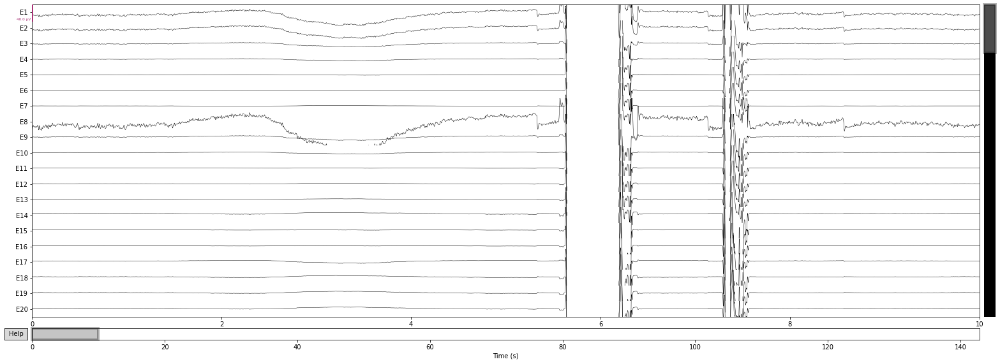

In [209]:
raw.plot()

In [205]:
plt.plot(raw.get_data()[0])

In [212]:
# Unordered set of items
{1, "a", 3, 1} == {3, 1, "a"}

True

In [213]:
my_tuple = (1, 2, "banana")

# AttributeError: 'tuple" object has not attribute 'append'
my_tuple.append(4) 

# TypeError: 'tuple' object does not support item assignment
my_tuple[1] = 4

AttributeError: 'tuple' object has no attribute 'append'

In [215]:
my_dictionary = {"key1": "value1", "key2": 4, 5: 6}
my_dictionary["new_key"] = 7
my_dictionary["key1"] = "new value"
print(my_dictionary)

{'key1': 'new value', 'key2': 4, 5: 6, 'new_key': 7}


In [216]:
from itertools import product
list(product([1, 2], ["a", "b", "c"]))

[(1, 'a'), (1, 'b'), (1, 'c'), (2, 'a'), (2, 'b'), (2, 'c')]

In [218]:
x = "55"
print(type(x))

<class 'str'>


qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backingstore: Back buffer dpr of 1 doesn't match <_NSViewBackingLayer: 0x7faac02dce80> contents scale of 2 - updating layer to match.
qt.qpa.backin

Channels marked as bad:
none
